# How the postprocess module works (by example)

In [1]:
# input images path & predicted npy files path
# src_img_root = '/Midgard/Data/hfang/sn7/test_public'
src_img_root = '/Midgard/Data/hfang/sn7/train'
pred_root = '/local_storage/users/hfang/HRNet_SN7/output/spacenet7/seg_hrnet_w48_512x512_sgd_lr1e-2_wd4e-5_bs_16_epoch70/test_results/npy_compose'

In [2]:
import os
import re
import time
import random
import sys
import multiprocessing
import warnings
warnings.filterwarnings('ignore')

import numpy as np
from PIL import Image
import cv2
import skimage.io
from skimage.draw import polygon
from skimage import measure
from skimage.segmentation import watershed
# from skimage.feature import peak_local_max

# import bug-free peak_local_max
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
from peak import peak_local_max

from scipy import ndimage as ndi
from rasterio import features

import solaris as sol
from shapely.ops import cascaded_union
from shapely.geometry import shape, Polygon

In [3]:
# dictionary: key -> AOI, value -> npy_files
dic = {}
npy_files = [os.path.join(pred_root, x) for x in os.listdir(pred_root)]
for npy_file in npy_files:
    key = '_'.join(npy_file.split('/')[-1].split('.')[0].split('_')[5:])
    if key not in dic:
        dic[key] = [npy_file]
    else:
        dic[key].append(npy_file)
        
params = []
for aoi, npy_list in dic.items():
    print("Process:", aoi)
    params.append(npy_list)

Process: L15-0632E-0892N_2528_4620_13
Process: L15-0566E-1185N_2265_3451_13
Process: L15-1015E-1062N_4061_3941_13
Process: L15-1848E-0793N_7394_5018_13
Process: L15-1615E-1206N_6460_3366_13
Process: L15-1276E-1107N_5105_3761_13
Process: L15-1438E-1134N_5753_3655_13
Process: L15-1200E-0847N_4802_4803_13
Process: L15-0387E-1276N_1549_3087_13
Process: L15-1690E-1211N_6763_3346_13


In [4]:
# hyperparameters
# finetune
# thres1 = 0.1
thres1 = 0.35
thres2_h1 = 1.0
thres2_l1 = 0.75
thres2_h2 = 0.6
thres2_l2 = 0.35
thres3_1 = 0.3
thres3_s = 0.45
thres3_d = 0.5
thres3_i = 0
thres3_m = 0.4
margin = 0
distance = 5
min_area = 25.5
polygon_buffer = 0

In [5]:
npy_list = dic['L15-1015E-1062N_4061_3941_13']

In [6]:
def get_respond_img(npy_file):
    sp = npy_file.split('.')[0].split('_')
    aoi = '_'.join(sp[5:])
    src_img_path = os.path.join(src_img_root, aoi, "images_masked", npy_file.replace(".npy", ".tif"))
    return src_img_path

In [7]:
import matplotlib as mpl
import matplotlib.cm as cmx
import matplotlib.pyplot as plt
import matplotlib.colors as colors
plt.rcParams.update({'font.size': 16})
mpl.rcParams['figure.dpi'] = 300

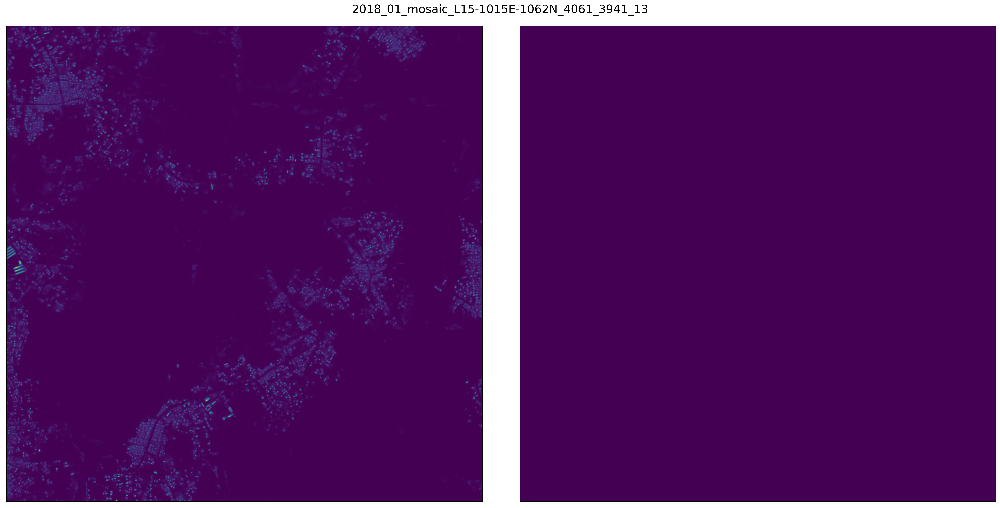

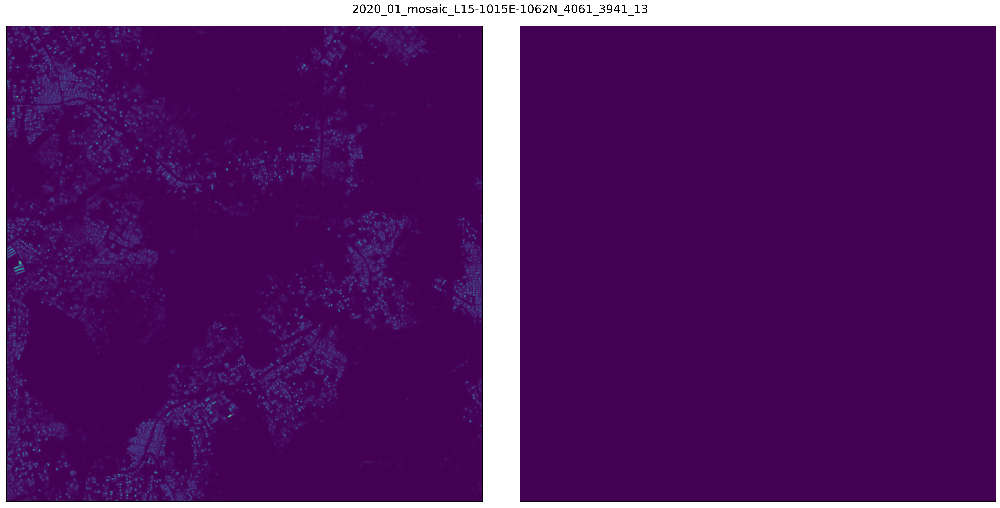

In [8]:
npy_list = sorted(npy_list)
npy_sum = 0
ignore_sum = 0
npys = []
ignore_masks = []
for iii, npy_file in enumerate(npy_list):
    npy = np.load(npy_file)
    img_file = get_respond_img(npy_file.split('/')[-1])
    src_img = skimage.io.imread(img_file)
    ### Enlarge npy 3x
#     npy = np.repeat(npy, 3, axis=0)
#     npy = np.repeat(npy, 3, axis=1)
#     assert npy.shape[0] == 3072 and npy.shape[1] == 3072
    ###
    mask = src_img[:,:,3]==0
    mask = np.repeat(mask, 3, axis=0)
    mask = np.repeat(mask, 3, axis=1)
    assert mask.shape[0]== src_img.shape[0] * 3 and mask.shape[1] == src_img.shape[1] * 3
    
    if iii == 0 or iii == (len(npy_list) - 1):
        figsize=(24, 12)
        name = img_file.split('/')[-1].split('.')[0].split('global_monthly_')[-1]
        fig, (ax0, ax1) = plt.subplots(1, 2, figsize=figsize)
        _ = ax0.imshow(npy)
        ax0.set_xticks([])
        ax0.set_yticks([])
        # _ = ax0.set_title(name)
        _ = ax1.imshow(mask)
        ax1.set_xticks([])
        ax1.set_yticks([])
        # _ = ax1.set_title(name)
        _ = fig.suptitle(name)
        plt.tight_layout()

    npy = npy[:mask.shape[0], :mask.shape[1]]
    npy[mask] = -10000
    npys.append(npy)

    ignore_mask = (npy > thres1)
    ignore_masks.append(ignore_mask)
    npy_sum = npy_sum + npy * ignore_mask
    ignore_sum = ignore_sum + ignore_mask

18


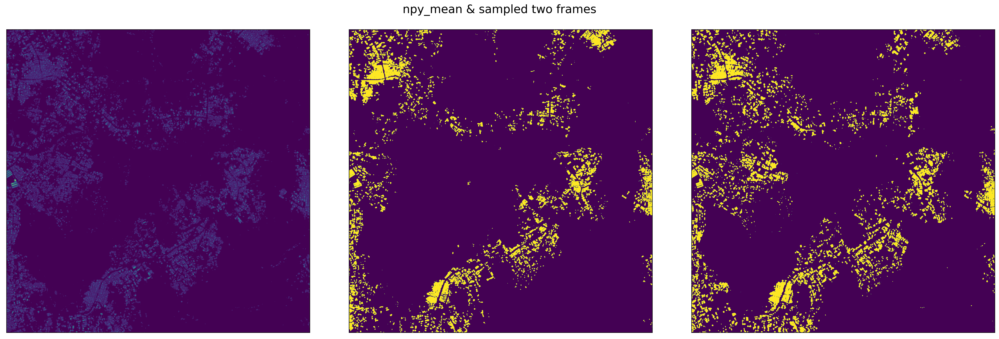

In [9]:
npy_mean = npy_sum / np.maximum(ignore_sum, 1)

npys = np.array(npys)
img_num = npys.shape[0]
print(img_num)

figsize=(24, 8)
name = 'npy_mean & sampled two frames'
fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=figsize)
_ = ax0.imshow(npy_mean)
ax0.set_xticks([])
ax0.set_yticks([])
# _ = ax0.set_title(name)
_ = ax1.imshow(ignore_masks[0])
ax1.set_xticks([])
ax1.set_yticks([])
# _ = ax1.set_title(name)
_ = ax2.imshow(ignore_masks[-1])
ax2.set_xticks([])
ax2.set_yticks([])
_ = fig.suptitle(name)
plt.tight_layout()

In [10]:
def get_building_polygon(mask, thres_h, thres_l, distance, min_area, polygon_buffer, conn=2, watershed_line=True):
    mask0 = mask > thres_h
    local_maxi = peak_local_max(mask, indices=False, footprint=np.ones((distance*2+1, distance*2+1)),
                            labels=(mask > thres_l))
    local_maxi[mask0] = True
    seed_msk = ndi.label(local_maxi)[0]

    mask = watershed(-mask, seed_msk, mask=(mask > thres_l), watershed_line=watershed_line)
    mask = measure.label(mask, connectivity=conn, background=0).astype('uint8')

    geoms_np = []
    geoms_polygons = []
    polygon_generator = features.shapes(mask, mask)
    for polygon, value in polygon_generator:
        p = shape(polygon)
        if polygon_buffer:
            p = p.buffer(polygon_buffer)
        if p.area >= min_area:
            p = p.simplify(tolerance=0.5)
            geoms_polygons.append(p)
            try:
                p = np.array(p.boundary.xy, dtype='int32').T
            except:
                p = np.array(p.boundary[0].xy, dtype='int32').T
            geoms_np.append(p)
    return geoms_np, geoms_polygons


def get_idx_in_polygon(contour):
    contour = contour.reshape(-1, 2) - 0.5
    p = Polygon(contour).buffer(-0.25)
    r, c = p.boundary.xy
    rr, cc = polygon(r, c)
    return rr, cc

In [11]:
print(npy_mean.sum())
contours, polygons = get_building_polygon(npy_mean, thres2_h1, thres2_l1, distance=distance, min_area=min_area, polygon_buffer=polygon_buffer)

1221662.1996340607


In [12]:
# ensure that npy_mean is not changed within the function get_building_polygon
print(npy_mean.sum())
print(len(contours))
print(len(polygons))

1221662.1996340607
3619
3619


In [13]:
# colors
vmax = 200
cmap = plt.get_cmap('hsv')  # 'jet'
cNorm  = colors.Normalize(vmin=0, vmax=vmax)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=cmap)
label_font_size = 4
im_pix_size_x, im_pix_size_y = 3072, 3072
figsize=(24, 24)

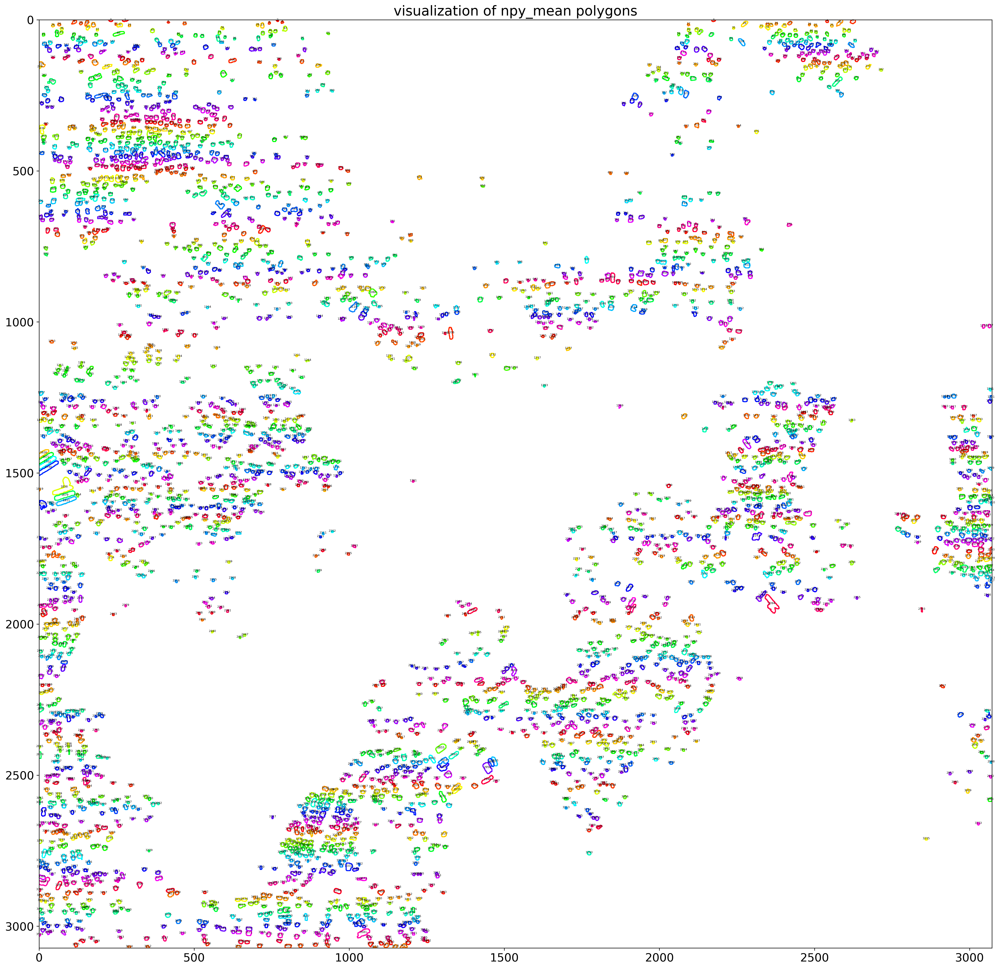

In [14]:
fig, axs = plt.subplots(figsize=figsize)
for id, polygon in enumerate(polygons):
    x, y = polygon.exterior.xy
    cx, cy = np.array(polygon.centroid.xy).astype(float)
    #print("centroid:", centroid)
    color_int = int(id) % vmax
    colorVal = scalarMap.to_rgba(color_int)
    axs.plot(x, y, c=colorVal)
    # poly id
    axs.annotate(str(id), xy=(cx, cy), ha='center', size=label_font_size)
    #text_object = plt.annotate(label, xy=(x_values[i], y_values[i]), ha='center')
    #ax.text(cx, cy, str(poly_id))
axs.set_xlim(0, im_pix_size_x)
axs.set_ylim(im_pix_size_y, 0)
title = 'visualization of npy_mean polygons'
axs.set_title(title)
plt.savefig("vis_npy_mean_ours_L15-1015E-1062N_4061_3941_13.png")
plt.show()